In [2]:
# Loading the libraries
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import seaborn as sns
import random
from sklearn.cluster import KMeans, DBSCAN
from sklearn.cluster import MeanShift, estimate_bandwidth 
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from ridgeplot import ridgeplot
from scipy import stats
from scipy.stats import ttest_ind
# plt.rcParams["figure.figsize"] = [6.4, 4.8]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
from pandas.plotting import parallel_coordinates


import warnings
warnings.filterwarnings('ignore')

In [4]:
# Synt1
# raw_data = pd.read_csv(r'..\Preprocessed_datasets\synt1_final.csv', index_col=0)
# raw_data.index = pd.RangeIndex(start=0, stop=2110, step=1)

# synt2
raw_data = pd.read_csv(r'..\Preprocessed_datasets\synt2_final.csv', index_col=0)
raw_data.index = pd.RangeIndex(start=0, stop=2350, step=1)

features = raw_data.drop(['errors'], axis=1)
# Number of errors
display(len(raw_data.loc[raw_data['errors']==1]))
display(len(raw_data.loc[raw_data['errors']==0]))
# display(raw_data)

790

1560

### Utils

In [5]:
def initialize_synthetic_data(raw_data, error_scaler, scale_features=False, with_errors=True):
    """Initialisation of the theoretical dataset. Scales all the features and can also scale the errors, which can be included or excluded for clustering 
    It returns a scaled dataset with new columns "clusters" = 0 and "new_clusters" = -1, which are required for HBAC """

    new_data = raw_data.copy(deep=True)

    if with_errors:
        scaling_factor = 0.8 #needs to be converted to scaling range [0.2 - 1.2]
        new_data['scaled_errors'] = new_data['errors'] * error_scaler

    #if just_features:
    #    new_data = new_data.drop(['errors', 'class'], axis=1)

    if scale_features:
        to_scale = raw_data.drop(['errors', 'class'], axis=1).columns
        new_data[to_scale] = StandardScaler().fit_transform(features[to_scale])
    
    #if with_classes:
    #    for col in ['errors']:
    #        new_data[col] = raw_data[col]

    new_data['clusters'] = 0
    new_data['new_clusters'] = -1
    return new_data

def plot_clusters(data, title, alpha):
    """This function returns a scatterplot of the clusters"""
    data.rename(columns={'x1' :'Feature 1'}, inplace=True )
    data.rename(columns={'x2':'Feature 2'}, inplace=True )
    # scatterplot = sns.scatterplot(data=data, x='x', y='y', alpha=0.8, hue="clusters", size='errors', sizes=(100, 20), palette="tab10")
    scatterplot = sns.scatterplot(data=data, x='Feature 1', y='Feature 2', alpha=alpha, hue="clusters", size='errors', sizes=(100, 20), palette="tab10")
    scatterplot.set_title(title)
    scatterplot.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1)
    plt.show()

In [6]:
# def pca_plot(data):
#     pca_features = data.drop(['scaled_errors', 'predicted_class', 'true_class', 'errors', 'clusters', 'new_clusters'], axis=1)
#     other_features = data[['scaled_errors', 'predicted_class', 'true_class', 'errors', 'clusters', 'new_clusters']]

#     df = pd.DataFrame(pca_features)
#     pca = pd.DataFrame(PCA(n_components=2).fit_transform(df), index=df.index)

#     temp_dataset = pca.join(other_features, how='left')
#     temp_dataset.rename( columns={0 :'1st'}, inplace=True )
#     temp_dataset.rename( columns={1 :'2nd'}, inplace=True )
    
#     scatterplot = sns.scatterplot(data=temp_dataset, x='1st', y='2nd', hue="clusters", size='errors', sizes=(100, 20), palette="tab10")
#     scatterplot.set_title('test')
#     plt.show()

def initialize_dataset(raw_data, with_errors=True, just_features=True, scale_features=True, with_classes=True):
    """Initialisation of the dataset. Scales all the features and can also scale the errors, which can be included or excluded for clustering 
    It returns a scaled dataset with new columns "clusters" = 0 and "new_clusters" = -1, which are required for HBAC """

    new_data = raw_data.copy(deep=True)

    if with_errors:
        scaling_factor = 0.8 #needs to be converted to scaling range [0.2 - 1.2]
        new_data['scaled_errors'] = new_data['errors'] * 0.8

    if just_features:
        new_data = new_data.drop(['errors', 'class'], axis=1)

    if scale_features:
        to_scale = raw_data.drop(['errors', 'class'], axis=1).columns
        new_data[to_scale] = StandardScaler().fit_transform(features[to_scale])
    
    if with_classes:
        for col in ['errors']:
            new_data[col] = raw_data[col]

    new_data['clusters'] = 0
    new_data['new_clusters'] = -1
    return new_data

def get_random_cluster(clusters):
    """This function returns the value of a random cluster
    clusters Df.Column the column clusters"""
    result = -1
    while (result == -1):
        result = random.randint(0, len(clusters.unique()))
    return result

def accuracy(results):
    """This function calculates the accuracy of a DF dataframe
    It requires a df.column named "errors" """ 
    if len(results) == 0:
        print("You are calculating the accuracy on a empty cluster") 
    correct = results.loc[results['errors'] == 0]
    acc = len(correct)/len(results)
    return acc

def bias_acc(data, cluster_id, cluster_col):
    """ This function calculates the negative bias, which is the accuracy of the selected cluster - the accuracy of the remaining clusters 
    Cluster col: the name of the DF column where the cluster assignments are """
    cluster_x = data.loc[data[cluster_col] == cluster_id]
    if len(cluster_x) ==0:
        print("This is an empty cluster! cluster ", cluster_id)
    remaining_clusters = data.loc[data[cluster_col] != cluster_id]
    if len(remaining_clusters) == 0:
        print("This cluster is the entire dataset. cluster ", cluster_id)
    return accuracy(cluster_x) - accuracy(remaining_clusters)

def bias_acc_towards_global_average(data, cluster_id, cluster_col, ave_acc):
    """ This function calculates the negative bias, which is the accuracy of the selected cluster - the average accuracy
    Cluster col: the name of the DF column where the cluster assignments are """
    cluster_x = data.loc[data[cluster_col] == cluster_id]
    return accuracy(cluster_x) - ave_acc

def get_next_cluster(data):
    """ This function returns the cluster number with the highest variance. The variance is calculated based on the errors of each cluster.
    The cluster with the highest variance will be selected as splitting cluster
    The function requires df.columns named "clusters" and "errors" """
    n_cluster = max(data['clusters'])
    highest_variance = -1
    cluster_number = 0

    for i in data['clusters'].unique():
        if (i == -1):
            continue
        cluster_i = data.loc[data['clusters'] == i]
        variance_cluster = np.var(cluster_i['errors'])
        
        if variance_cluster > highest_variance:
            highest_variance = variance_cluster
            cluster_number = i
            print('--> Cluster with the highest variance:', cluster_number)

    return cluster_number

def get_max_abs_bias(fulldata, function=bias_acc):
    """ This function returns the absolute value of highest negative bias of the newly introduced clusters 
    fulldata (DataFrame) should include a column new_clusters """
    max_abs_bias = -999999
    for cluster_number in fulldata['new_clusters'].unique():
        if cluster_number == -1: #Outliers in DBScan
            continue
        current_bias = abs(function(fulldata, cluster_number, "new_clusters")) # abs function
        if current_bias > max_abs_bias:
            max_abs_bias = current_bias
    return max_abs_bias

def get_max_negative_bias(fulldata, function=bias_acc):
    """ This function returns the highest negative bias of the newly introduced clusters 
    fulldata (DataFrame) should include a column new_clusters  --> used for identifying underperformed clusters"""
    max_abs_bias = -999999
    for cluster_number in fulldata['new_clusters'].unique():
        if cluster_number == -1: #Outliers in DBScan
            continue
        current_bias = (function(fulldata, cluster_number, "new_clusters")) # abs function
        if current_bias < max_abs_bias:
            print('current bias: ', current_bias)
            print('max abs bias: ', max_abs_bias)
            max_abs_bias = current_bias
    return max_abs_bias

def get_max_bias_cluster(fulldata, function=bias_acc):
    """ This function returns the cluster linked to the highest negative bias of the newly introduced clusters 
    fulldata (DataFrame) should include a column new_clusters """
    max_abs_bias = 100
    best_cluster = -2
    for cluster_number in fulldata['clusters'].unique():
        if cluster_number == -1: #Outliers in DBScan
            continue
        current_bias = function(fulldata, cluster_number, "clusters") # abs function
        print(f"{cluster_number} has bias {current_bias}")
        if current_bias < max_abs_bias:
            max_abs_bias = current_bias
            best_cluster = cluster_number
    return best_cluster

def calculate_variance(data):
    """This function calculates the variance for a DF. It requires a df.column named "clusters" and it uses the bias_acc_towards_global_avg"""
    variance_list_local = []
    for j in data['clusters'].unique():
        average_accuracy = accuracy(data)
        neg_bias_clus = bias_acc(data, j, 'clusters') 
        variance_list_local.append(neg_bias_clus) #variance_list was "neg_bias_list" before
    variance = np.var(variance_list_local) #this was "neg_bias_list"
    return variance

def get_min_cluster_size(data):
    """Returns the size of the smallest new cluster"""
    min_cluster_size = len(data)
    for i in data['new_clusters'].unique():
        # exclude the cluster -1 from being seen as a cluster, since it contains outliers
        if i == -1:
            continue
        size = len(full_data.loc[full_data['new_clusters']==i])
        if size < min_cluster_size:
            min_cluster_size = size
    return min_cluster_size

# 1. Hierarchical Bias-Aware KMeans Clustering 

In [7]:
clus_model_kwargs = {
    "n_clusters": 2,
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
}

In [11]:
full_data = initialize_synthetic_data(raw_data, scale_features=False, error_scaler=0)

#synt1
# full_data.index = pd.RangeIndex(start=0, stop=2110, step=1)

#synt2
full_data.index = pd.RangeIndex(start=0, stop=2350, step=1)
full_data.head()


,x1,x2,errors,class,scaled_errors,clusters,new_clusters
0,13.284373,7.619191,0,0,0,0,-1
1,11.393496,9.621649,0,0,0,0,-1
2,12.429412,12.181668,0,0,0,0,-1
3,9.940076,11.477821,0,0,0,0,-1
4,12.091499,11.199033,0,0,0,0,-1


average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 2
MAX_ITER is reached
[0.2922081089184984, 0.2166074096371371, 0.17411125075702177, 0.17411125075702177, 0.17411125075702177, 0.17411125075702177, 0.17411125075702177, 0.17411125075702177, 0.17411125075702177, 0.14468152176448834, 0.14468152176448834, 0.14468152176448834, 0.14468152176448834, 0.14468152176448834, 0.14468152176448834, 0.14468152

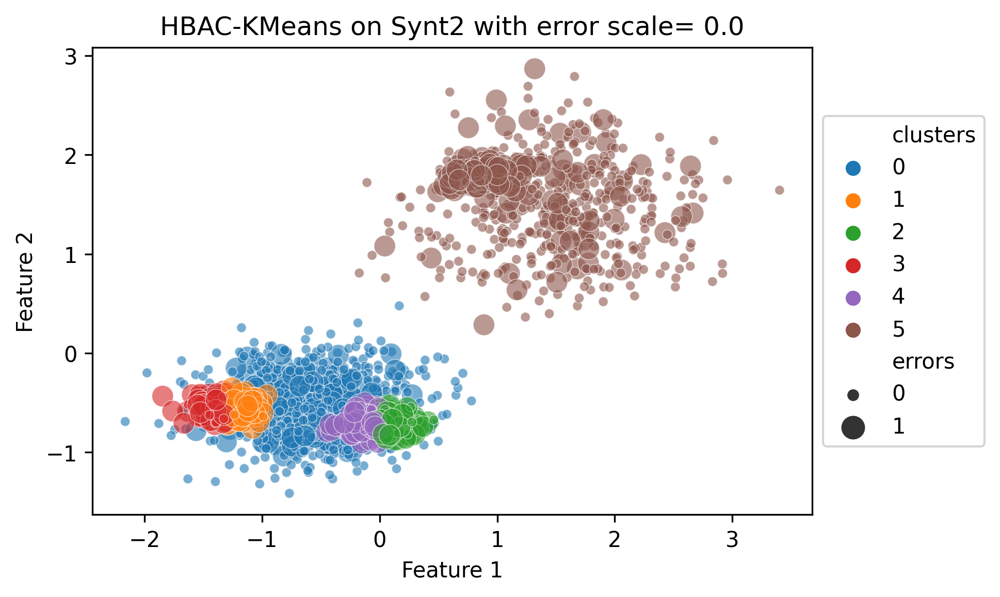

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 7
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 7
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 9
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 7
--> Cluster with the highest variance: 10
--> Cluster wit

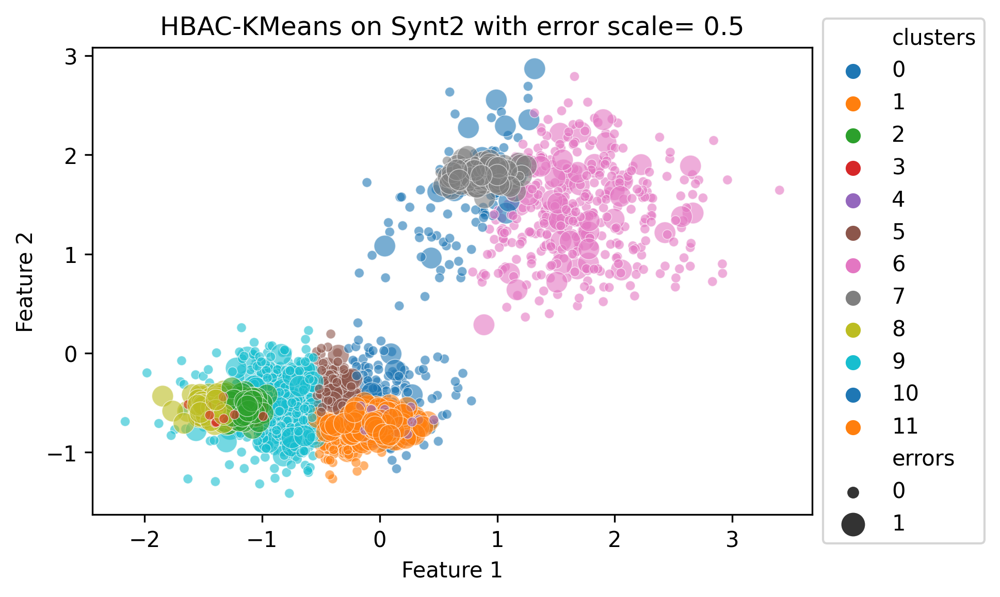

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 8
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 8
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 8
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 10
--> Cluster wit

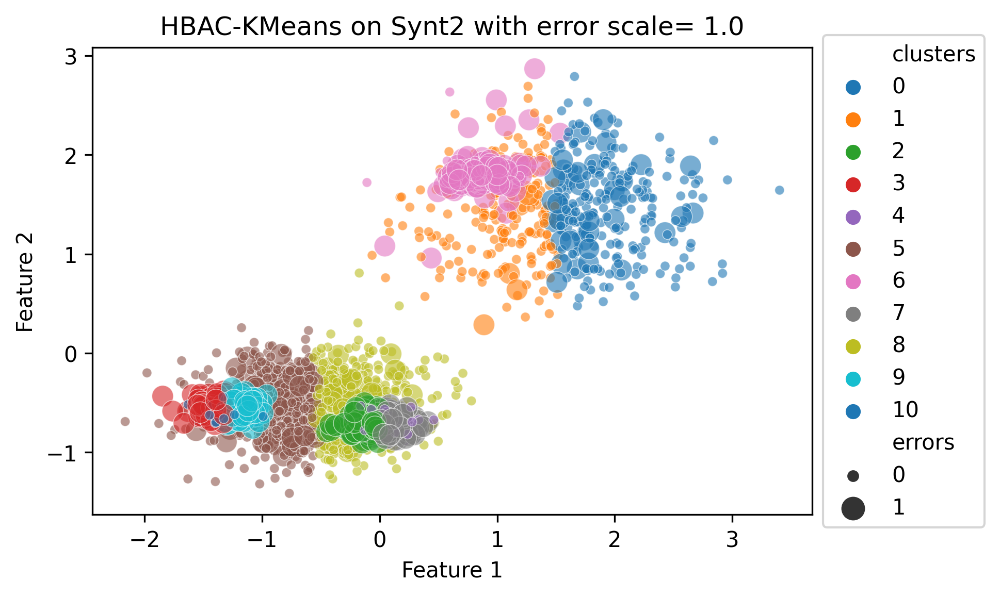

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 7
--> Cluster with the highest variance: 8
--> Cluster with the highest variance: 8
--> Cluster with the highest variance: 8
--> Cluster with the highest variance: 8
--> Cluster with the highest variance: 8
--> Cluster with the highest variance: 8
MAX_ITER is reached
[0.2922081089184984, 0.2166074096371371, 0.2825156875514322, 0.3270010616506889, 0.25026498368032574, 0.30505220043306586, 0.3292858394933892, 0.3084904656167027, 0.29437905307317574, 0.294379053073175

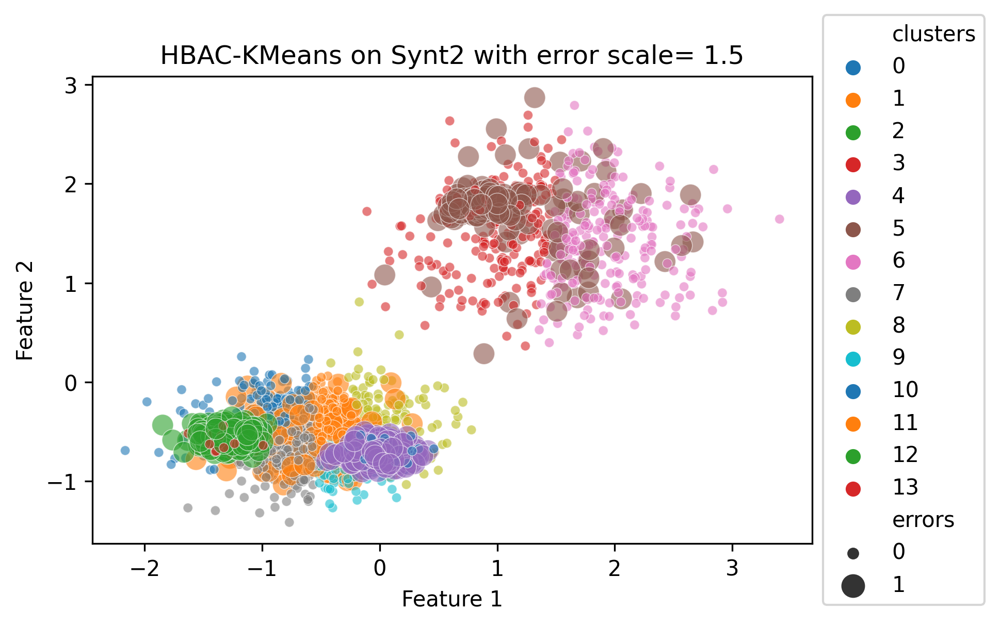

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 7
--> Cluster with the highest variance: 7
--> Cluster with the highest variance: 7
--> Cluster with the highest variance: 7
MAX_ITER is reached
[0.2922081089184984, 0.3791845161607292, 0.252332379438246, 0.3332549427285188, 0.3623363165045446, 0.3299960788281529, 0.3077657777498394, 0.3077657777498394, 0.3077657777498394, 0.2873229551026444, 0.2873229551026444, 0.267716988454426, 0.267716988454426, 0.267716988454426, 0.2507527186772418, 0.2507527186772418, 0.2507527186772418, 0.2507527186772418]
2.0-999999
7 has bias 0.35601622352411
3 has bias 0.3868756121449559
6 has bias 0.37636969

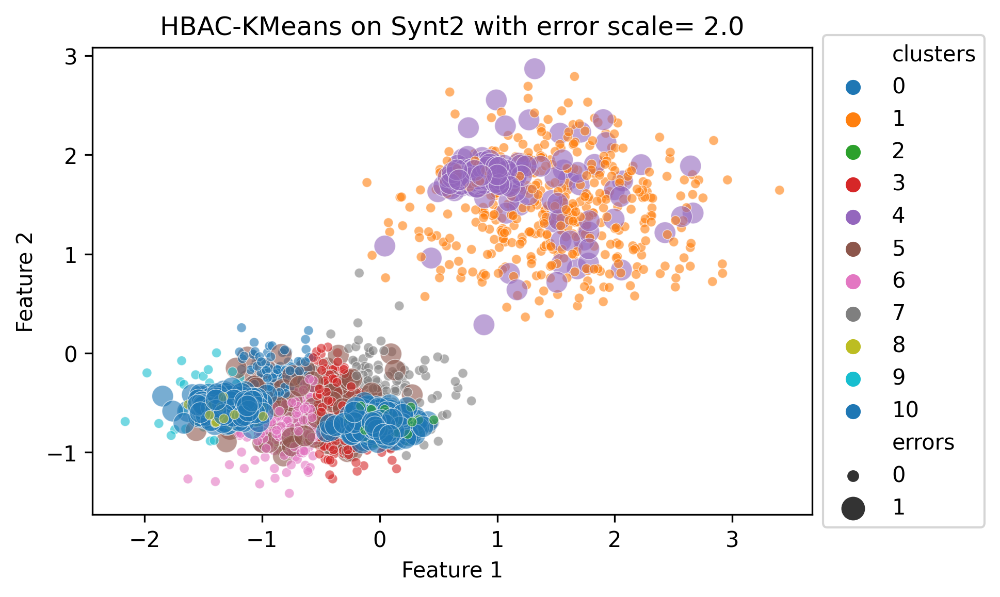

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 4
MAX_ITER is reached
[0.4184272862634197, 0.3608969047675787, 0.4211310342276402, 0.3054523332921878, 0.3054523332921878, 0.3054523332921878, 0.3054523332921878, 0.33630503823534674, 0.33630503823534674, 0.33630503823534674, 0.31273889763953305, 0.31273889763953305, 0.31273889763953305, 0.3002002166032013, 0.3002002166032013, 0.300200216603201

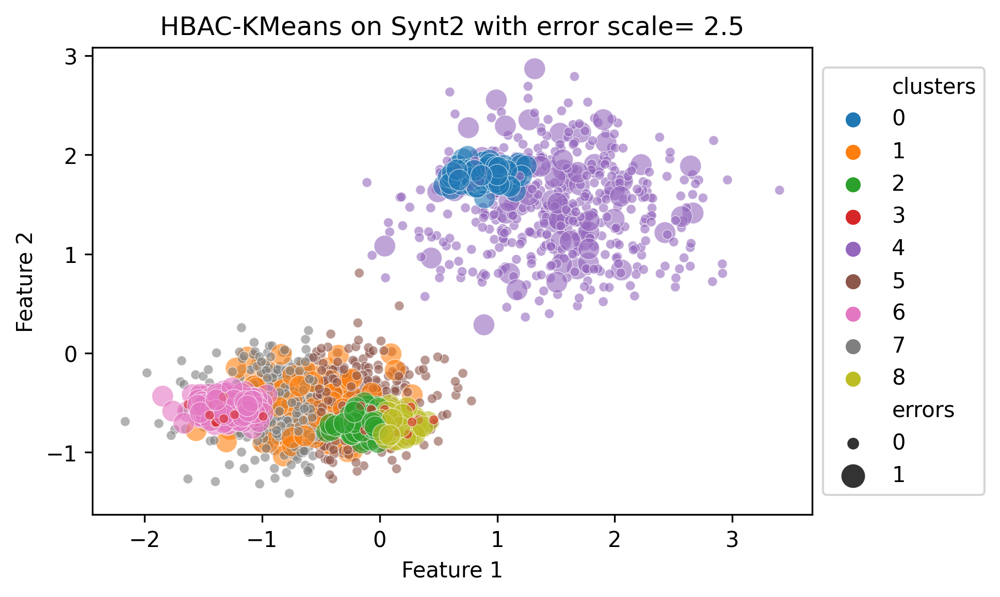

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 6
--> Cluster with the highest variance: 6
MAX_ITER is reached
[0.63806011730655, 0.4734299643017255, 0.50262148740014, 0.37497421379418416, 0.32338499758834777, 0.2898296580387168, 0.2898296580387168, 0.2624524893091814, 0.2624524893091814, 0.2624524893091814, 0.2624524893091814, 0.2624524893091814, 0.2385835511247723, 0.2385835511247723, 0.2676298898093101, 0.2676298898093101, 0.2676298898093101, 0.2676298898093101]
3.0-999999
6 has bias 0.35601622352411
4 has bias 0.38668624571708277
5 has bias 0.41666666666666663
2 has bias -0.69642857142857

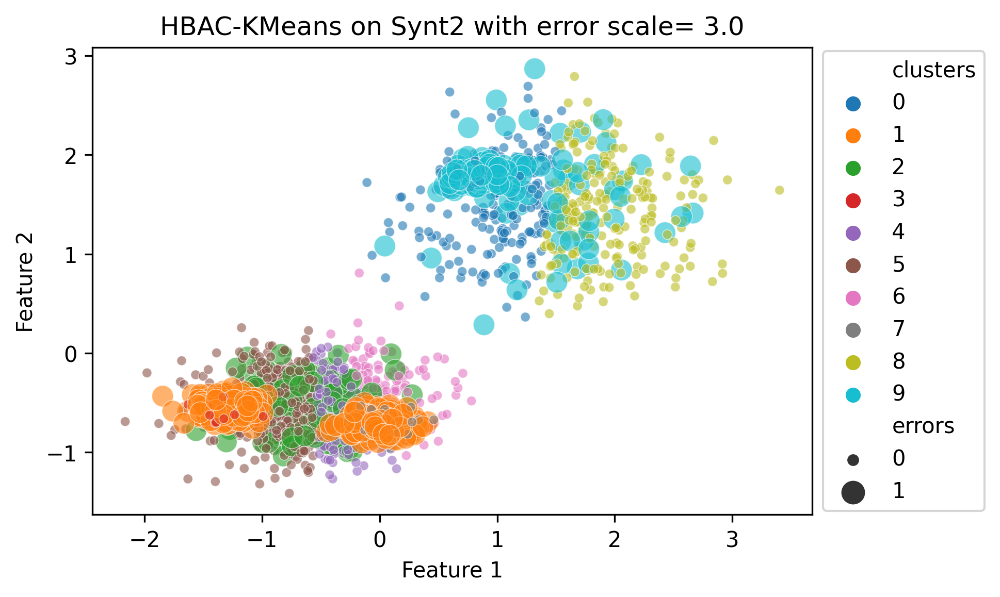

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 3
MAX_ITER is reached
[1.0, 0.5232679256459004, 0.39449561213917, 0.31588486227124923, 0.26859268295735234, 0.26859268295735234, 0.26859268295735234, 0.23399589496895964, 0.23399589496895964, 0.20700284872332603, 0.20700284872332603, 0.2391385388939223, 0.2391385388939223, 0.21901629590058042, 0.21901629590058042, 0.24748129675190347, 0.24748129675190347, 0.24748129675190347]
3.5-999999
3 has bias 0.35649819494584833
5 has bias 0.3605659516202647
9 has bias 0.3747628083491461
4 has bias 0.3684701492537313

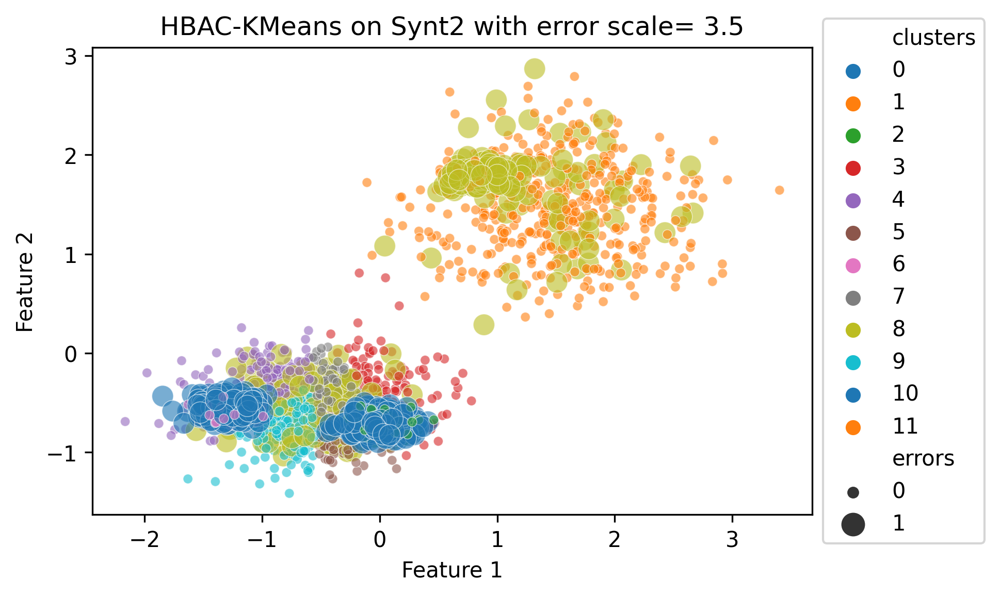

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 5
MAX_ITER is reached
[1.0, 0.5232679256459004, 0.39449561213917, 0.31588486227124923, 0.26860055413727374, 0.26860055413727374, 0.23374980306902776, 0.23374980306902776, 0.23374980306902776, 0.20700334144373667, 0.20700334144373667, 0.20700334144373667, 0.20700334144373667, 0.20700334144373667, 0.18515207109697626, 0.18515207109697626, 0.16781753571630192, 0.16781753571630192]
4.0-999999
5 has bias 0.35617673579801623
2 has bias 0.3605659516202647
9 has bias 0.35746606334841624
6 has bias 0.35974499089253187
4 has bias 0.36847014925373134
1 has bias -1.0
8 has bias 0.35142348754448394

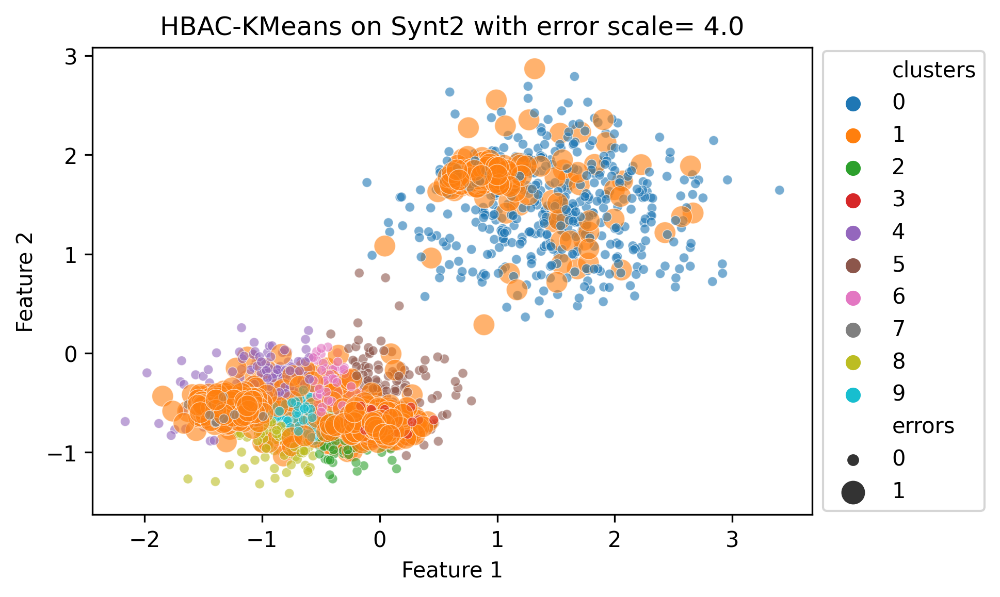

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 4
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 5
--> Cluster with the highest variance: 5
MAX_ITER is reached
[1.0, 0.5232679256459004, 0.39449561213917, 0.31588486227124923, 0.26860055413727374, 0.26860055413727374, 0.26860055413727374, 0.2897923710106305, 0.2897923710106305, 0.3077327462663737, 0.3077327462663737, 0.2870026555444592, 0.2870026555444592, 0.2870026555444592, 0.2870026555444592, 0.2682124072108357, 0.2682124072108357, 0.2682124072108357]
4.5-999999
5 has bias 0.35617673579801623
8 has bias 0.3605659516202647
3 has bias 0.41535226077812826
4 has bias 0.35974499089253187
6 has bias -0.6964285714285714
2 has bias 0.4197662061636557
7 has bias -0.7185628742514

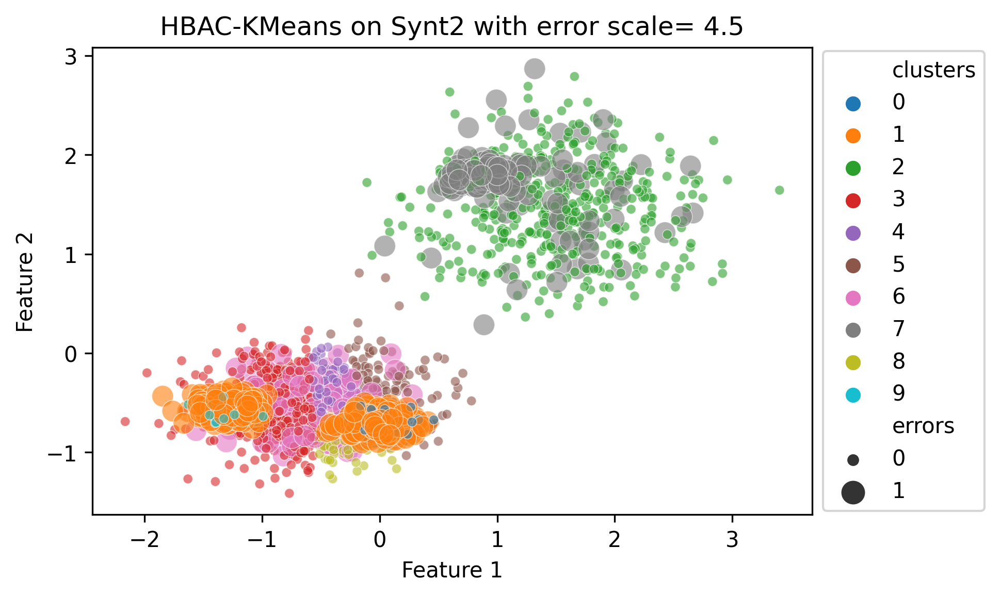

average_accuracy is:  0.6638297872340425
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 0
MAX_ITER is reached
[1.0, 0.5232679256459004, 0.39449561213917, 0.31588486227124923, 0.26859268295735234, 0.26859268295735234, 0.26859268295735234, 0.28978379968255813, 0.28978379968255813, 0.3038580283334912, 0.3038580283334912, 0.3038580283334912, 0.3076401047977073, 0.3076401047977073, 0.3076401047977073, 0.3034234718175782, 0.3034234718175782, 0.2961388837571776]
5.0-999999
0 has bias 0.35649819494584833
5 has bias 0.3874448258950466
4 has bias 0.41535226077812826
1 has bias -0.6964285714285714
2 has bias 0.4197662061636557
8 has bias -0.7

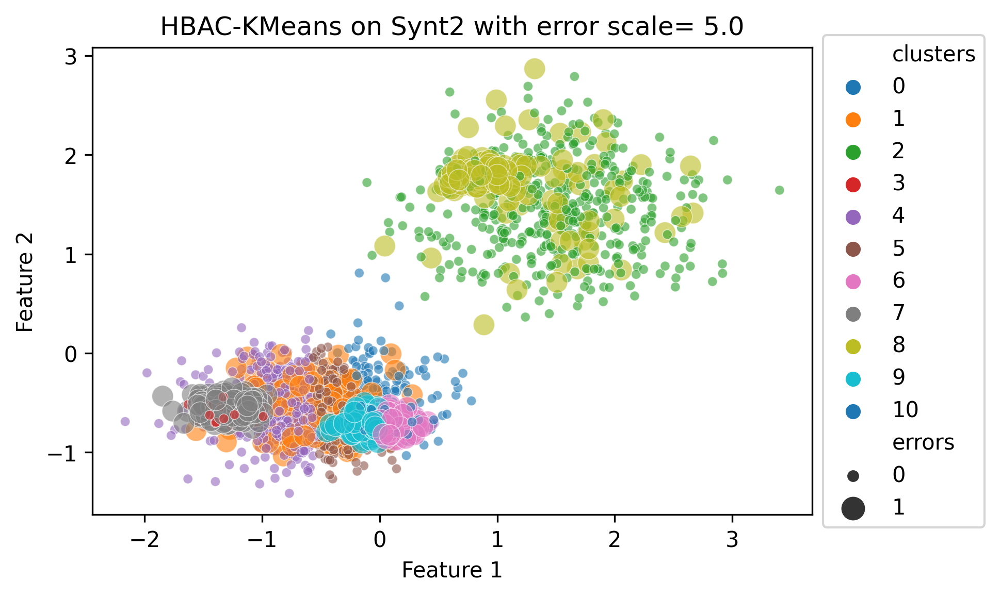

In [12]:

for error_scale in np.arange(0.0, 5.5, 0.5):
    full_data = initialize_synthetic_data(raw_data, scale_features=True, error_scaler=error_scale)

    full_data.index = pd.RangeIndex(start=0, stop=2350, step=1)
    full_data.head()


    MAX_ITER = 20
    x = 0 # cluster number
    initial_bias = 0
    # plot_clusters(full_data, 'HBAC-KMeans on Synt2', 0.6)
    variance_list = []
    average_accuracy = accuracy(full_data)
    minimal_splittable_cluster_size = round(0.05 * len(full_data))
    minimal_acceptable_cluster_size = round(0.03 * len(full_data))
    print("average_accuracy is: ", average_accuracy) 

    for i in range(1, MAX_ITER):
        if i != 1:
            variance_list.append(calculate_variance(full_data)) 
        full_data['new_clusters'] = -1
        candidate_cluster = full_data.loc[full_data['clusters'] == x] 

        if len(candidate_cluster) < minimal_splittable_cluster_size:
            x = get_random_cluster(full_data['clusters'])
            continue
        
        # Apply Kmeans 
        kmeans_algo = KMeans(**clus_model_kwargs).fit(candidate_cluster.drop(['clusters', 'new_clusters', 'errors'], axis=1))
        
        candidate_cluster['new_clusters'] = pd.DataFrame(kmeans_algo.predict(candidate_cluster.drop(['clusters', 'new_clusters', 'errors'], axis=1)),index=candidate_cluster.index) 
        full_data['new_clusters'] = candidate_cluster['new_clusters'].combine_first(full_data['new_clusters'])

        max_neg_bias = get_max_negative_bias(full_data) # was get_max_abs_bias, but now it only finds the discriminated clusters
        min_new_size = get_min_cluster_size(full_data)
        
        if (max_neg_bias <= initial_bias) & (min_new_size > minimal_acceptable_cluster_size): #abs: >
            # Add new cluster
            n_cluster = max(full_data['clusters'])
            full_data['clusters'][full_data['new_clusters'] == 1] =  n_cluster + 1
            
            # plot_clusters(full_data, 'HBAC-KMeans on Synt2 with error scale= ' + str(error_scale), 0.6)
            x = get_next_cluster(full_data)
            initial_bias = max_neg_bias
        else:
            x = get_random_cluster(full_data['clusters'])
            
    print('MAX_ITER is reached')
    print(variance_list)
    print(str(error_scale) + str(get_max_negative_bias(full_data)))
    c = get_max_bias_cluster(full_data)
    print(f"cluster {c} has the highest negative bias")
    most_biased_cluster_kmeans_aware = bias_acc(full_data, c, 'clusters')
    print(most_biased_cluster_kmeans_aware)
    plot_clusters(full_data, 'HBAC-KMeans on Synt2 with error scale= ' + str(error_scale), 0.6)

## Analysing the biased cluster

In [10]:
# Goal 1: Identifying highest biased cluster
c = get_max_bias_cluster(full_data)
highest_biased_cluster = full_data[full_data['clusters']==c]
len(highest_biased_cluster)

accuracy_full_data = accuracy(full_data)
most_biased_cluster_kmeans_aware = bias_acc(full_data, c, 'clusters')
full_data[full_data['clusters']==c]

print('General accuracy of classifier on this dataset:', accuracy_full_data)
# print('Number of clusters: ', full_data['clusters'].unique()) 

print(f"cluster {c} has the highest negative bias")
print(most_biased_cluster_kmeans_aware)



5 has bias 0.35617673579801623
4 has bias 0.3878252331860579
0 has bias 0.3747628083491461
7 has bias 0.3528360875390799
1 has bias -0.7569141193595342
10 has bias 0.35033259423503327
9 has bias 0.3749406739439962
2 has bias 0.3717647058823529
8 has bias -0.8436992969172525
6 has bias 0.3552158273381295
3 has bias 0.346947738252086
General accuracy of classifier on this dataset: 0.6638297872340425
cluster 8 has the highest negative bias
-0.8436992969172525


Number of instances in discriminated cluster: 226
Number of errors in discriminated clusters:  171
found discriminated cluster:


,Feature 1,Feature 2,errors,class,scaled_errors,clusters,new_clusters
1651,11.756380,9.118911,1,3,0.8,1,-1.0
1653,11.885852,8.569704,1,3,0.8,1,-1.0
1656,12.370940,8.350180,1,3,0.8,1,-1.0
1657,10.804158,8.828299,0,3,0.0,1,-1.0
1662,11.091278,9.239122,0,3,0.0,1,-1.0
...,...,...,...,...,...,...,...
2095,11.924924,8.587157,1,3,0.8,1,-1.0
2096,11.772465,9.063997,1,3,0.8,1,-1.0
2097,11.858010,8.794638,1,3,0.8,1,-1.0
2098,12.097554,8.315909,1,3,0.8,1,-1.0


x1
this is the t-statistic -3.452533068279627
this is the p-value: 0.0005652304141649132
x2
this is the t-statistic -37.51938338317484
this is the p-value: 2.9114405800255025e-239
errors
this is the t-statistic 15.373723943282387
this is the p-value: 3.9242257027873874e-39
class
this is the t-statistic 59.8868552007005
this is the p-value: 0.0


,unscaled_discriminated,unscaled_remaining,difference
x1,11.730584,12.017920,-0.287335
x2,8.682036,14.050618,-5.368581
errors,0.756637,0.291431,0.465206
class,3.000000,1.163842,1.836158


,x1,x2,errors,index
unscaled_discriminated,11.730584,8.682036,0.756637,unscaled_discriminated
unscaled_remaining,12.017920,14.050618,0.291431,unscaled_remaining


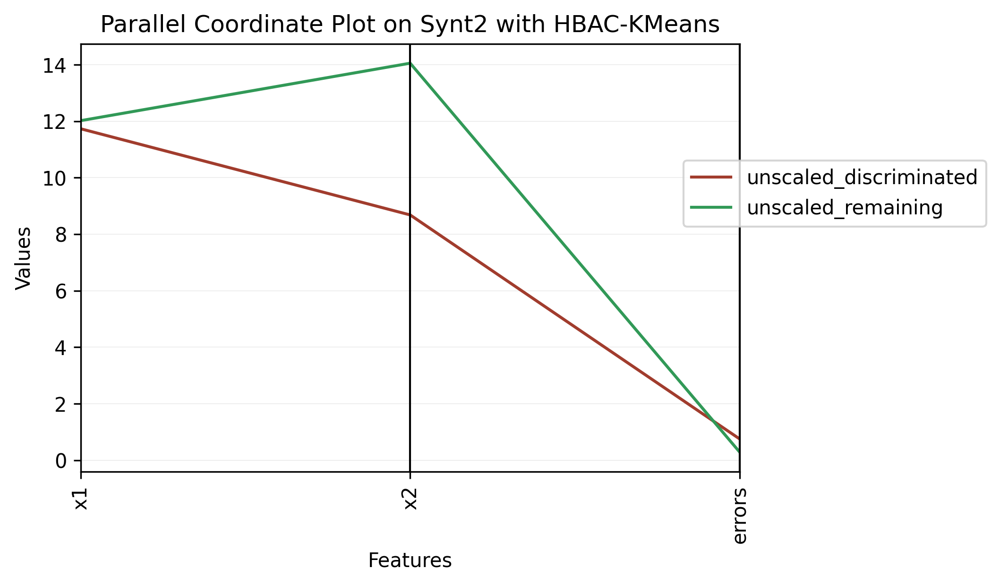

In [11]:
discriminated_cluster = full_data[full_data['clusters']==c]

# results 
print('Number of instances in discriminated cluster:', len(discriminated_cluster))
print('Number of errors in discriminated clusters: ', len(discriminated_cluster.loc[discriminated_cluster['errors']==1]))
print('found discriminated cluster:')
display(discriminated_cluster)

# unscaling the clusters
unscaled_discriminated = raw_data.loc[discriminated_cluster.index, :]
# unscaled other data
unscaled_remaining = raw_data.drop(discriminated_cluster.index)

# Welch's test 
for i in unscaled_remaining:
    welch_i = stats.ttest_ind(unscaled_discriminated[i], unscaled_remaining[i], equal_var=False)
    print(i)
    print('this is the t-statistic', welch_i.statistic)
    print('this is the p-value:', welch_i.pvalue)


# Creating DF with mean difference between features
mean_clusters = pd.DataFrame()
mean_clusters['unscaled_discriminated'] = unscaled_discriminated.mean()
mean_clusters['unscaled_remaining'] = unscaled_remaining.mean()
mean_clusters['difference'] = unscaled_discriminated.mean() - unscaled_remaining.mean()
display(mean_clusters)


# creating df for parallel coordinate plot
df_parallel = pd.DataFrame()
df_parallel['unscaled_discriminated'] = unscaled_discriminated.mean()
df_parallel['unscaled_remaining'] = unscaled_remaining.mean()
df_parallel = df_parallel.drop(['class'])
# df_parallel['difference'] = unscaled_discriminated.mean() - unscaled_remaining.mean()
df_parallel_transpose = df_parallel.T
df_parallel_transpose['index'] = df_parallel_transpose.index
display(df_parallel_transpose.head())

# create parallel coordinate plot
def create_parallel_coord_plot(copy_research_transpose, title):
    disc_plot = parallel_coordinates(copy_research_transpose, 'index', color= ('#a13c2d', '#319957'))
    plt.xticks(rotation=90)
    plt.legend(loc='upper left', bbox_to_anchor=(0.9,0.75)) 
    plt.xlabel("Features")
    plt.ylabel("Values")
    plt.grid(linewidth=0.1)
    plt.title(title)
    plt.show()

create_parallel_coord_plot(df_parallel_transpose, "Parallel Coordinate Plot on Synt2 with HBAC-KMeans")

## Ridgeline / Density plot

In [30]:
# df with discriminated and remaining clusters 

df_all = raw_data.copy(deep=True)
df_all["bias"] = "remaining"
#original_preprocessed[original_preprocessed.index in bias_index, "analysis_plot"] = "biased"

discriminated = df_all.loc[discriminated_cluster.index]
discriminated["bias"] = "discriminated"
df_all["bias"] = discriminated["bias"].combine_first(df_all['bias'])

# check to find discriminated instances in df
df_all.loc[df_all['bias']=='discriminated']


,x1,x2,errors,class,bias
1,7.651526,6.614556,0,0,discriminated
7,7.801611,6.935621,1,0,discriminated
13,7.201168,6.413749,0,0,discriminated
31,7.838708,8.318713,1,0,discriminated
33,7.737190,6.149372,0,0,discriminated
...,...,...,...,...,...
1469,7.558020,5.732615,0,2,discriminated
1470,6.754280,6.148515,0,2,discriminated
1482,7.230986,5.796456,0,2,discriminated
1485,8.248928,6.976059,1,2,discriminated


In [31]:
df_all.columns
welchtest = pd.DataFrame()
# welchtest = df_all[['Age', 'Job', 'Credit amount', 'Duration', 'bias']]
welchtest = df_all
welchtest.columns

Index(['x1', 'x2', 'errors', 'class', 'bias'], dtype='object')

1
2
3


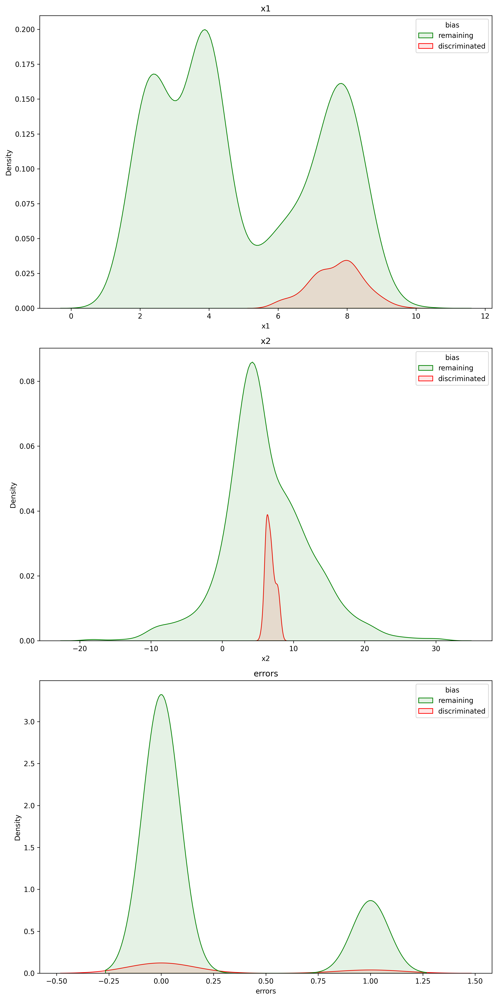

In [32]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(10,20))
# creating a dictionary with one specific color per group:
my_pal = {"remaining": "g", "discriminated": "r"}

i = 0
for col in welchtest.columns:
    sns.kdeplot(data=welchtest, x=col, shade=True, hue="bias", multiple='layer', ax=ax[i], palette=my_pal, alpha=0.1) # axis tweedimenionaal. Dus doorlopen met mod van i en / 5 naar beneden afgerond.
    ax[i].set_title(col, fontsize=12) # title niet overlappen, Grootte zelf bepalen. Maar 1 legenda 
    i += 1
    print(i) # dit en alles er onder moet uiteindelijk weg
    if i >= 3: 
        break

plt.tight_layout()

plt.show()



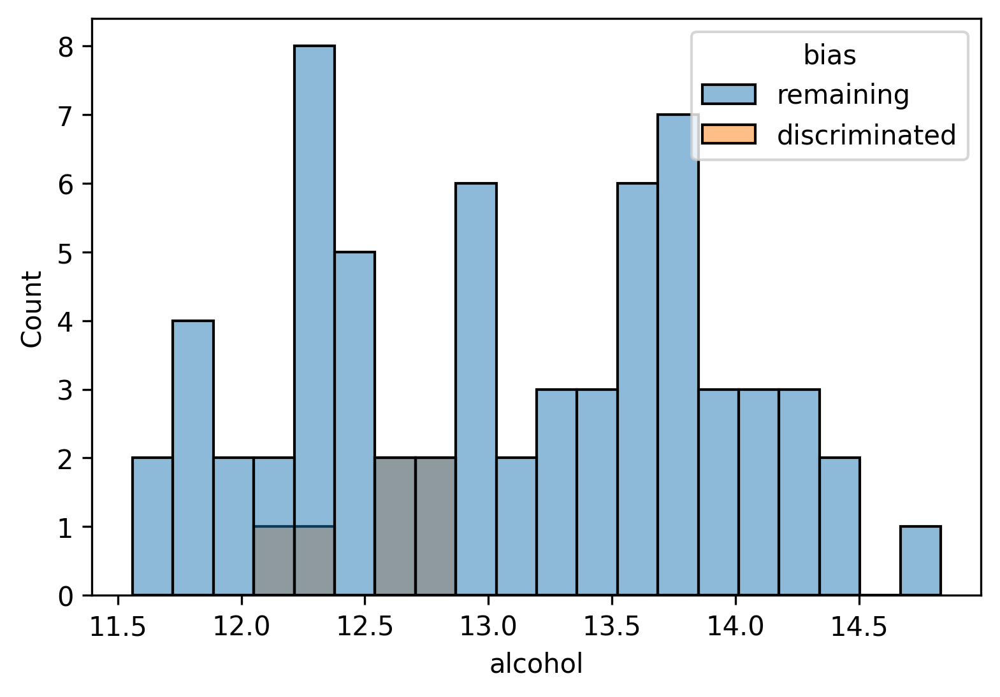

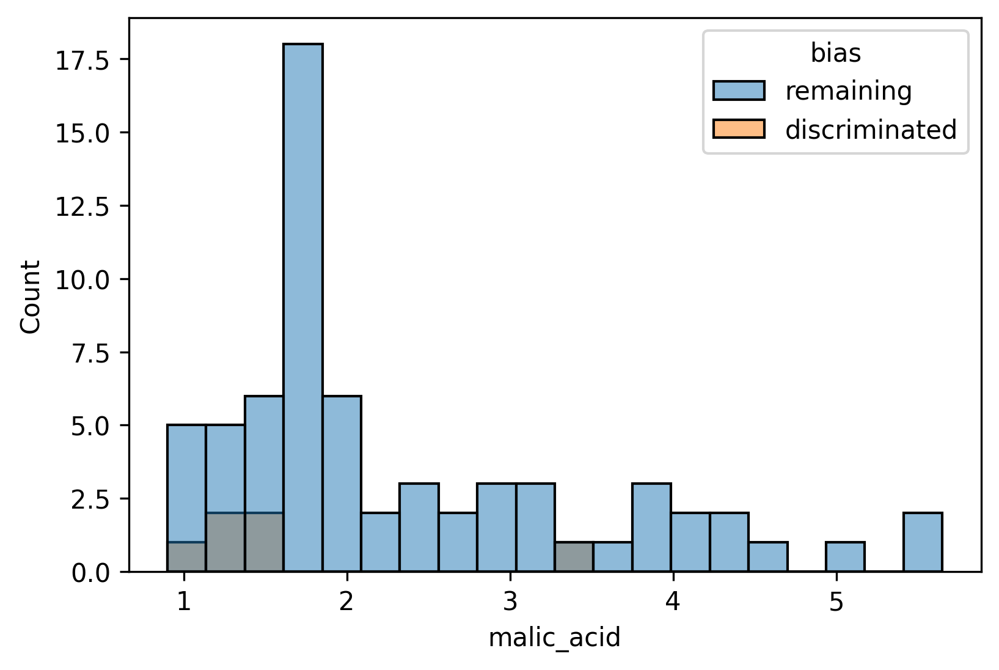

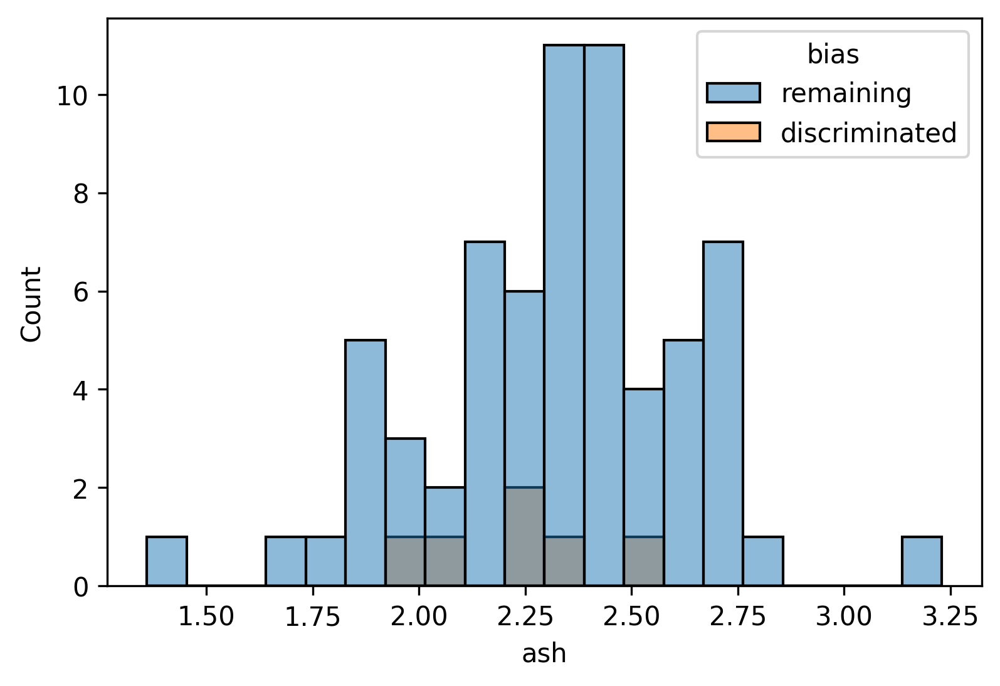

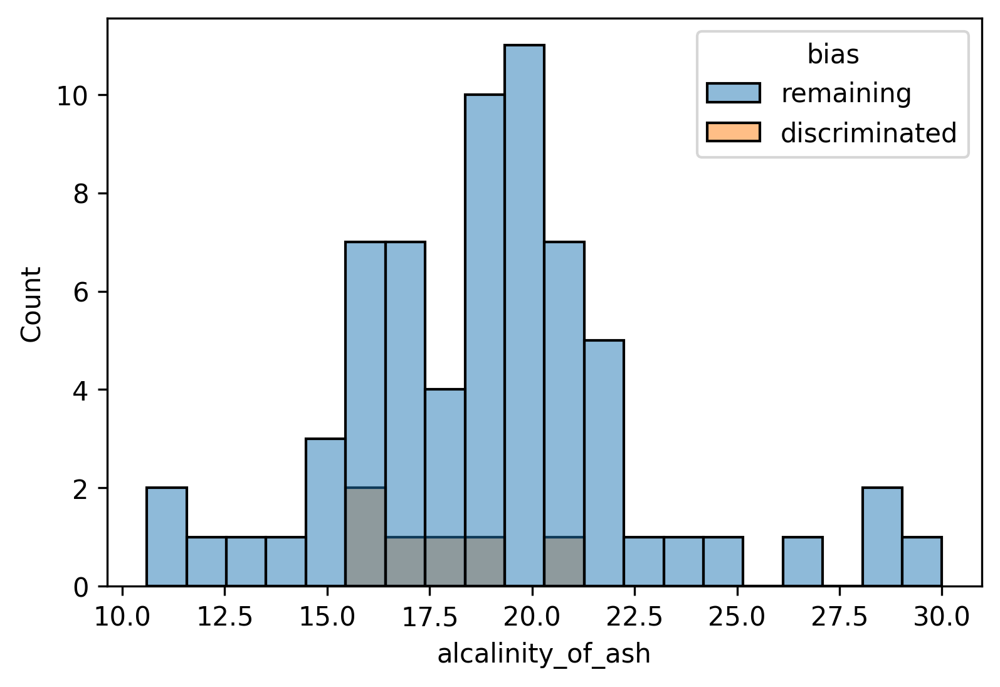

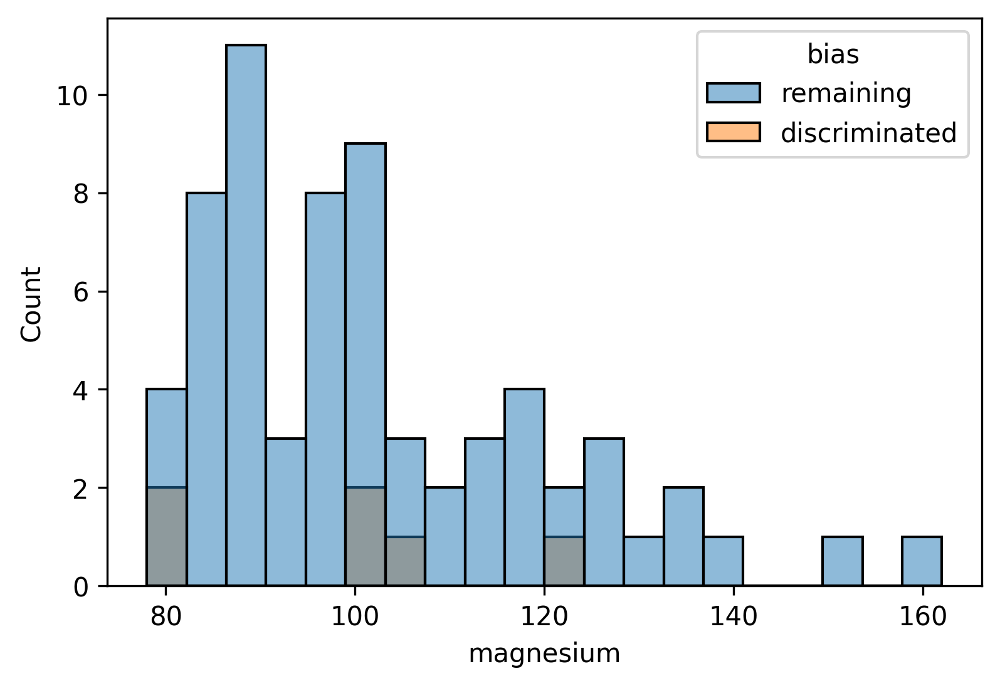

...

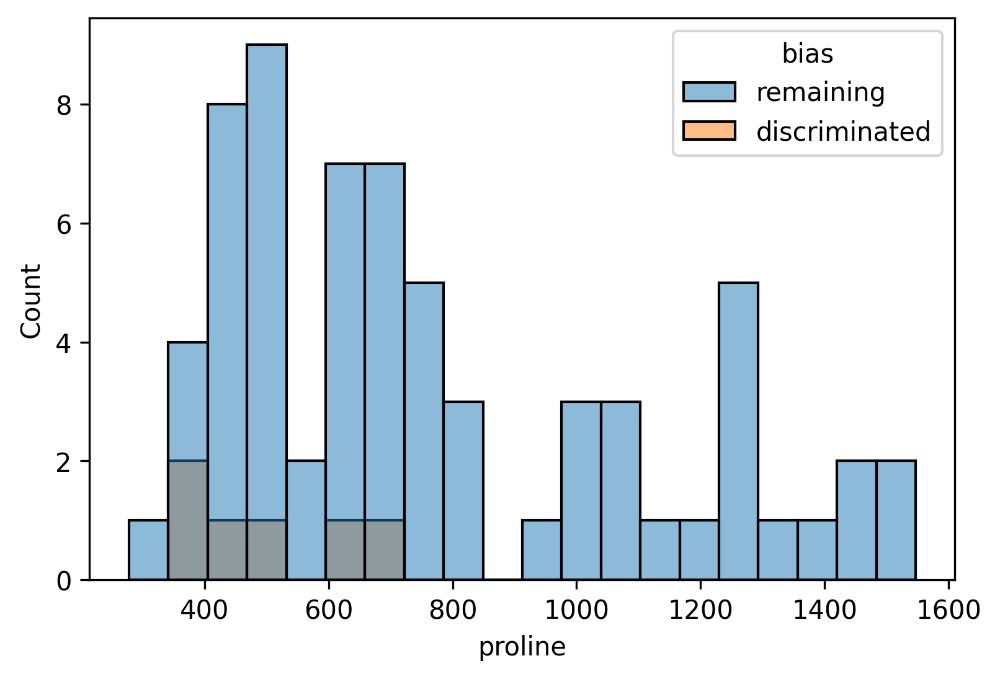

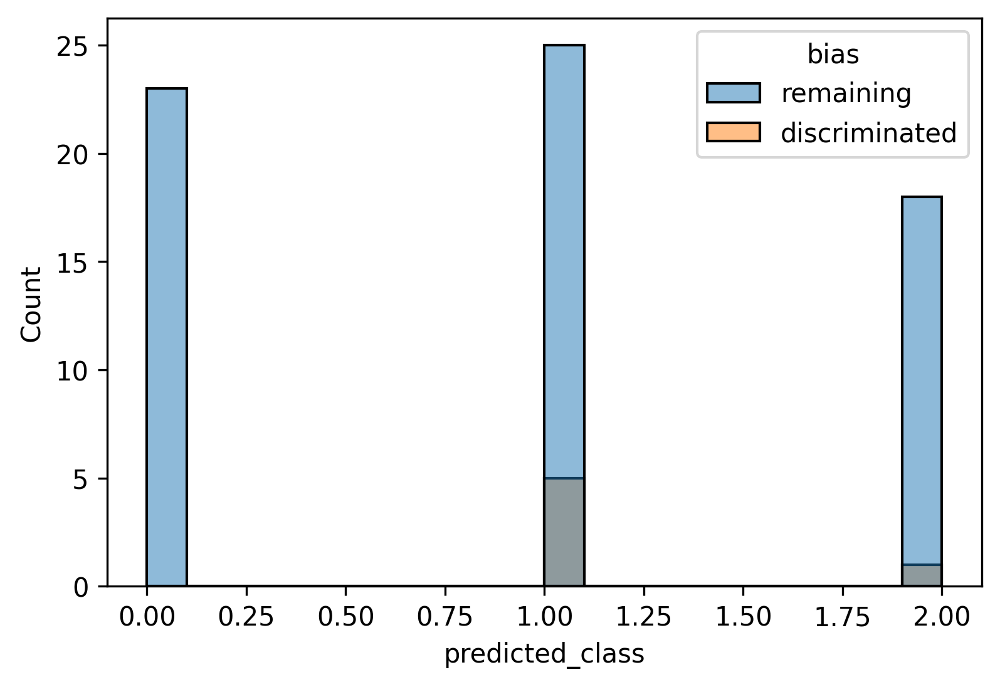

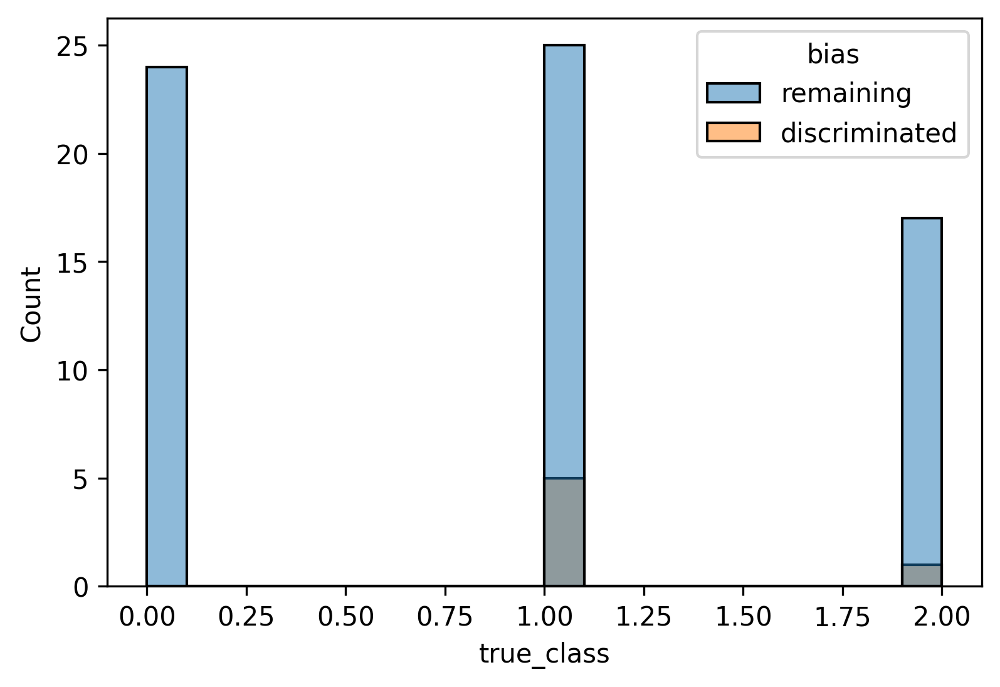

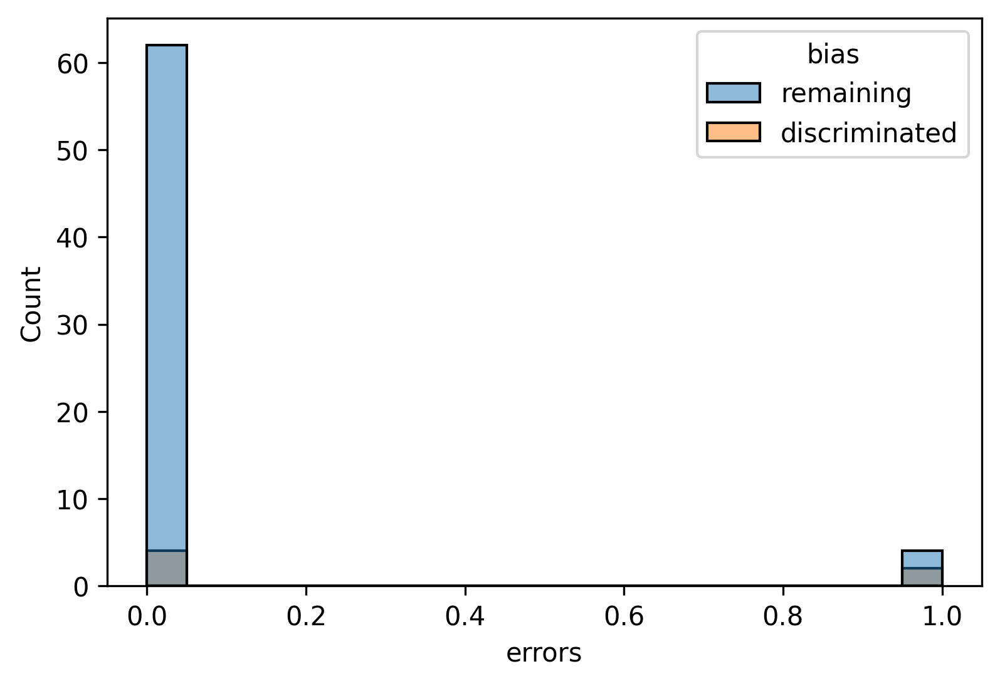

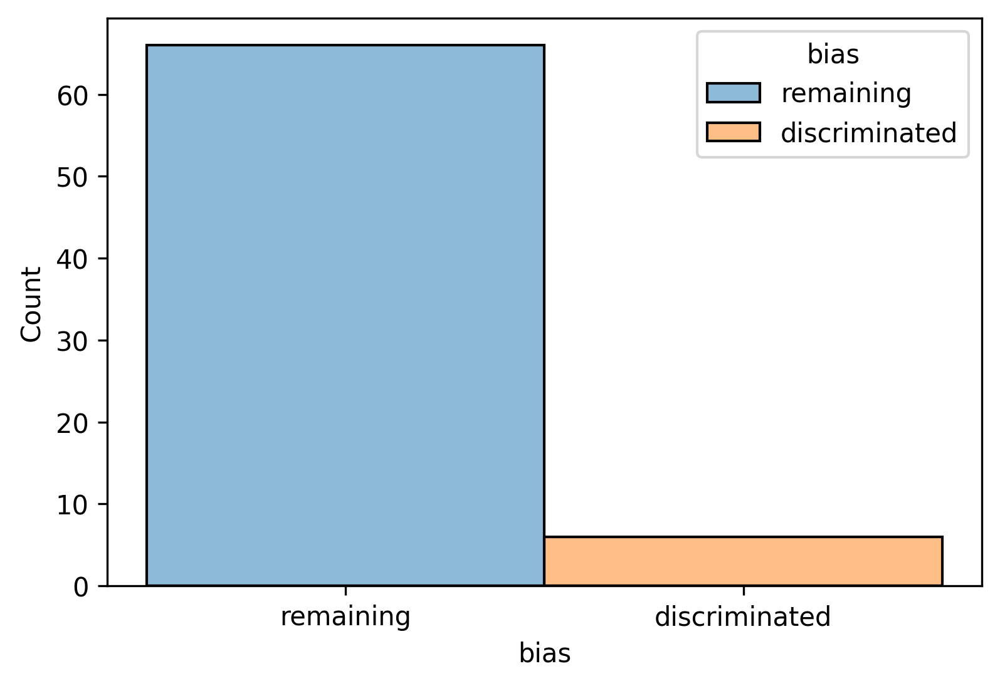

In [25]:
for i in df_all.columns:
    sns.histplot(data=df_all, x=i, hue='bias', bins=20)

    plt.show()

1
2
3
4
5


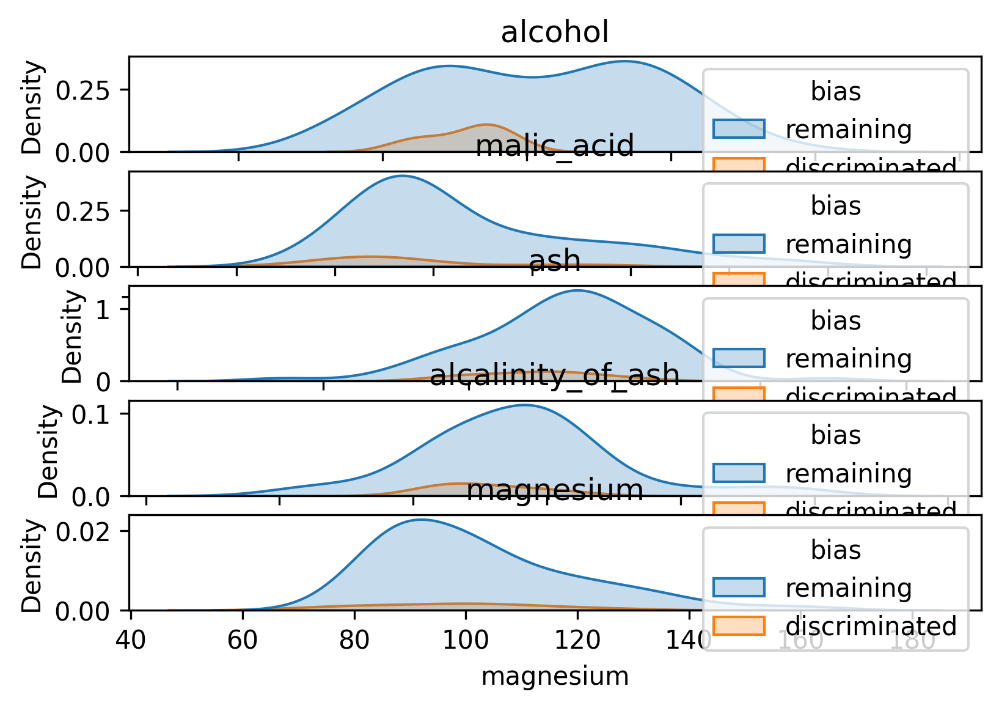

In [26]:
fig, ax = plt.subplots(nrows=5, ncols=1)

i = 0
for col in df_all.columns:
    sns.kdeplot(data=df_all, x=col, shade=True, hue="bias", multiple='layer', ax=ax[i]) # axis tweedimenionaal. Dus doorlopen met mod van i en / 5 naar beneden afgerond.
    ax[i].set_title(col) # title niet overlappen, Grootte zelf bepalen. Maar 1 legenda 
    i += 1
    print(i) # dit en alles er onder moet uiteindelijk weg
    if i >= 5: 
        break

#plt.tight_layout()   
plt.show()



In [19]:
df_all.columns
welchtest = pd.DataFrame()
welchtest = df_all
# welchtest = df_all[['Age', 'Job', 'Credit amount', 'Duration', 'bias']]
welchtest.to_csv('credit_kmeans_densplot')


AttributeError: 'numpy.ndarray' object has no attribute 'xaxis'

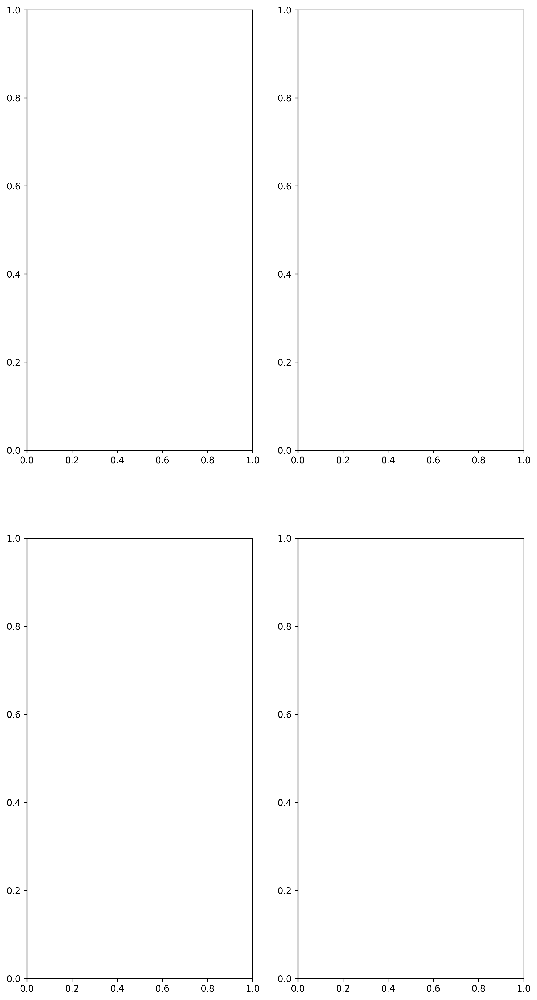

In [16]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10,20))
# creating a dictionary with one specific color per group:
my_pal = {"remaining": "g", "discriminated": "r"}

i = 0
for col in welchtest.columns:
    sns.kdeplot(data=welchtest, x=col, shade=True, hue="bias", multiple='layer', ax=ax[i], palette=my_pal, alpha=0.1) # axis tweedimenionaal. Dus doorlopen met mod van i en / 5 naar beneden afgerond.
    ax[i].set_title(col, fontsize=12) # title niet overlappen, Grootte zelf bepalen. Maar 1 legenda 
    i += 1
    print(i) # dit en alles er onder moet uiteindelijk weg
    if i >= 4: 
        break

# plt.tight_layout()

plt.show()



In [29]:
df_all

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315,proline,predicted_class,true_class,errors,bias
104,12.51,1.73,1.98,20.5,85.0,2.20,1.92,0.32,1.48,2.94,1.04,3.57,672.0,1,1,0,remaining
67,12.37,1.17,1.92,19.6,78.0,2.11,2.00,0.27,1.04,4.68,1.12,3.48,510.0,1,1,0,remaining
118,12.77,3.43,1.98,16.0,80.0,1.63,1.25,0.43,0.83,3.40,0.70,2.12,372.0,2,1,1,discriminated
39,14.22,3.99,2.51,13.2,128.0,3.00,3.04,0.20,2.08,5.10,0.89,3.53,760.0,0,0,0,remaining
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0,2,2,0,remaining
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12,13.75,1.73,2.41,16.0,89.0,2.60,2.76,0.29,1.81,5.60,1.15,2.90,1320.0,0,0,0,remaining
47,13.90,1.68,2.12,16.0,101.0,3.10,3.39,0.21,2.14,6.10,0.91,3.33,985.0,0,0,0,remaining
8,14.83,1.64,2.17,14.0,97.0,2.80,2.98,0.29,1.98,5.20,1.08,2.85,1045.0,0,0,0,remaining
124,11.87,4.31,2.39,21.0,82.0,2.86,3.03,0.21,2.91,2.80,0.75,3.64,380.0,1,1,0,remaining


AttributeError: 'numpy.ndarray' object has no attribute 'xaxis'

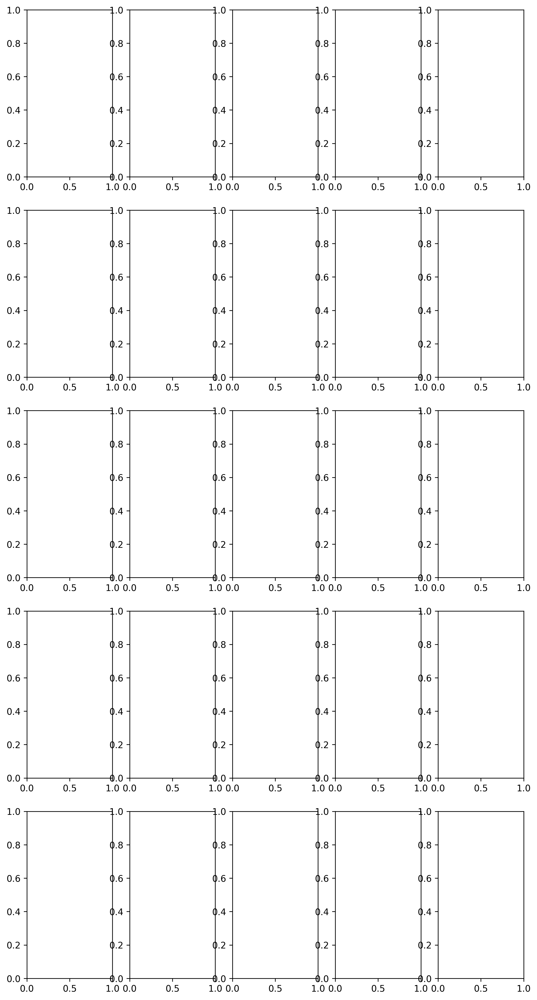

In [28]:
fig, ax = plt.subplots(nrows=5, ncols=5, figsize=(10,20))
# creating a dictionary with one specific color per group:
my_pal = {"remaining": "g", "discriminated": "r"}

i = 0
for col in df_all.columns:
    sns.kdeplot(data=df_all, x=col, shade=True, hue="bias", multiple='layer', ax=ax[i], palette=my_pal, alpha=0.1) # axis tweedimenionaal. Dus doorlopen met mod van i en / 5 naar beneden afgerond.
    ax[i].set_title(col, fontsize=12) # title niet overlappen, Grootte zelf bepalen. Maar 1 legenda 
    i += 1
    print(i) # dit en alles er onder moet uiteindelijk weg
    if i >= 5: 
        break

plt.tight_layout()

plt.show()



## Seaborn Pairplot / Density plot

In [24]:
sns.pairplot(df_all, hue="bias")

MemoryError: In RendererAgg: Out of memory

MemoryError: In RendererAgg: Out of memory

<Figure size 10500x10500 with 196 Axes>